# Sheet 11

## 10.1

### 7. and 8.

First we implement the minmod slope-limiter:

In [2]:
%matplotlib inline
from matplotlib.animation import FuncAnimation
import numpy as np
import matplotlib.pyplot as plt
from slope_tools import minmod

def advect_minmod(rho, dx, dt, u=1):
    """
    Parameters:
    - rho: array, current values of ρ at grid points.
    - dx: float, grid spacing.
    - dt: float, time step size.
    - u: float, advection velocity (default is 1).
    """
    N = len(rho)
    rho_new = np.zeros_like(rho)

    # Update the internal points using the Lax Wendroff scheme
    for i in range(1, N-1):
        rho_new[i] = rho[i] + (u * dt / dx) * (rho[i-1] - rho[i]) + (u * dt / 2 - u**2 * dt**2 / (2 * dx)) * (minmod((rho[i-1]-rho[i-2]) / dx , (rho[i]-rho[i-1]) / dx) - minmod((rho[i]-rho[i-1]) / dx , (rho[i+1]-rho[i]) / dx))

    # Apply boundary conditions using ghost cells
    rho_new[0] = 1  # Left boundary
    rho_new[-1] = 0.25  # Right boundary

    return rho_new



Now we implement the Superbee slope-limiter.

In [3]:
from slope_tools import maxmod

def advect_superbee(rho, dx, dt, u=1):
    """
    Parameters:
    - rho: array, current values of ρ at grid points.
    - dx: float, grid spacing.
    - dt: float, time step size.
    - u: float, advection velocity (default is 1).
    """
    N = len(rho)
    rho_new = np.zeros_like(rho)

    # Update the internal points using the Lax Wendroff scheme
    for i in range(1, N-1):
        rho_new[i] = rho[i] + (u * dt / dx) * (rho[i-1] - rho[i]) + (u * dt / 2 - u**2 * dt**2 / (2 * dx)) * (
            maxmod(minmod((rho[i]-rho[i-1]) / dx , 2*(rho[i-1]-rho[i-2]) / dx), minmod(2*(rho[i]-rho[i-1]) / dx , (rho[i-1]-rho[i-2]) / dx)) 
            - maxmod(minmod((rho[i+1]-rho[i]) / dx , 2*(rho[i]-rho[i-1]) / dx), minmod(2*(rho[i+1]-rho[i]) / dx , (rho[i]-rho[i-1]) / dx))
            )

    # Apply boundary conditions using ghost cells
    rho_new[0] = 1  # Left boundary
    rho_new[-1] = 0.25  # Right boundary

    return rho_new

In [4]:
def simulate_advection(advect_x, N=100, t_max=3, steps=200, u=1):
    dx = 4 / N
    dt = t_max / steps
    x = np.linspace(0, 4, N)
    

    # Initial condition
    rho = np.where(x <= 1, 1, 0.25)
    rho_history = np.zeros((steps, N))
        
    for n in range(steps):
        rho_history[n] = rho
        rho = advect_x(rho, dx, dt, u)
       
        
    return rho_history, x

def simulate_advection_ani(advect_x, N=100, t_max=3, steps=200, u=1):
    
    rho_history, x = simulate_advection(advect_x, N=N, t_max=t_max, steps=steps, u=u)
    
    # Plotting setup
    fig, ax = plt.subplots()
    line, = ax.plot(x, rho_history[0], color='b')
    ax.set_xlabel('x')
    ax.set_ylabel('Density')
    ax.set_title('1D Advection Over Time')

    # Animation function
    def update(frame):
        line.set_ydata(rho_history[frame])
        ax.set_title(f"Time Step: {frame}")
        return line,

    ani = FuncAnimation(fig, update, frames=steps, blit=True)
    plt.close(fig)
    
    # Display animation inline
    from IPython.display import HTML
    return HTML(ani.to_jshtml())

# Call the simulation with the minmod limiter
simulate_advection_ani(advect_minmod)

In [5]:
#Call the simulation with the superbee limiter
simulate_advection_ani(advect_superbee)

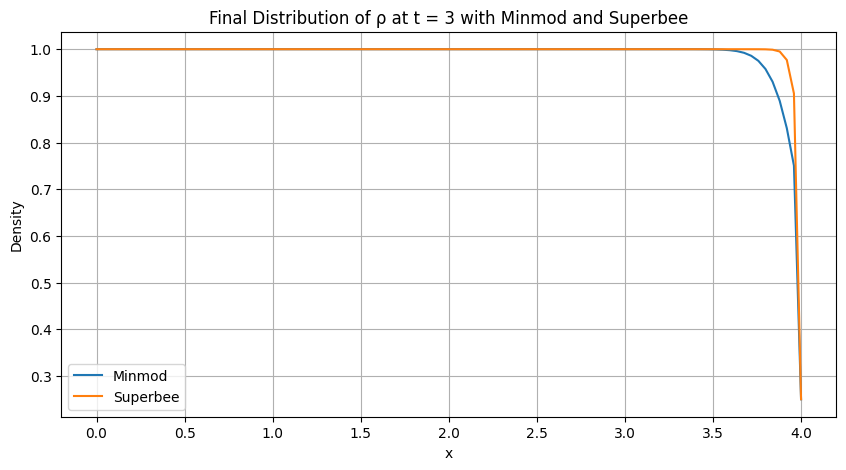

In [6]:
rho_history_minmod, x_minmod = simulate_advection(advect_minmod, N=100, t_max=3, steps=200, u=1)
rho_history_superbee, x_superbee = simulate_advection(advect_superbee, N=100, t_max=3, steps=200, u=1)

plt.figure(figsize=(10, 5))
plt.plot(x_minmod, rho_history_minmod[-1], label="Minmod")
plt.plot(x_superbee, rho_history_superbee[-1], label="Superbee")
plt.legend()
plt.title("Final Distribution of ρ at t = 3 with Minmod and Superbee")
plt.xlabel("x")
plt.ylabel("Density")
plt.grid(True)
plt.show()

# 9.

In [7]:
def TV(q_n):
    """Calculate the Total Variation of a given array."""
    diff = np.abs(q_n[1:] - q_n[:-1])
    return np.sum(diff)


def is_it_TVD(advect_x, rho_history, tolerance=1e-12):
    """
    Check if the given advection method is Total Variation Diminishing (TVD).
    
    Parameters:
    - advect_x: The advection function (e.g., advect_minmod or advect_superbee).
    - rho_history: 2D array where each row is the state of rho at a time step.
    - tolerance: Small value to account for numerical precision issues.
    """
    for i in range(len(rho_history) - 1):
        tv_current = TV(rho_history[i])
        tv_next = TV(rho_history[i + 1])
        
        if tv_next > tv_current + tolerance:
            print(f"{advect_x.__name__} method is NOT TVD. Violation at step {i}.")
            print(f"TV[i] = {tv_current}, TV[i+1] = {tv_next}")
            return
    
    print(f"{advect_x.__name__} method IS TVD.")


is_it_TVD(advect_minmod, rho_history_minmod)
is_it_TVD(advect_superbee, rho_history_superbee)
           

advect_minmod method IS TVD.
advect_superbee method IS TVD.


In this case, we can check that this two slope limiters are in fact TVD as expected. Nevertheless, we found that (in this escenario), they do not decrease, because TV is 0.75 for all steps for both methods (without accounting numerical imprecisions). The method still are TVD because they ensure TV does not increase, but it does not decrease it because there is no diffusion. The limiter are doing their job by preventing oscillations, and the constant TV is then expectable. 

## 10.2

# 1. and 2.

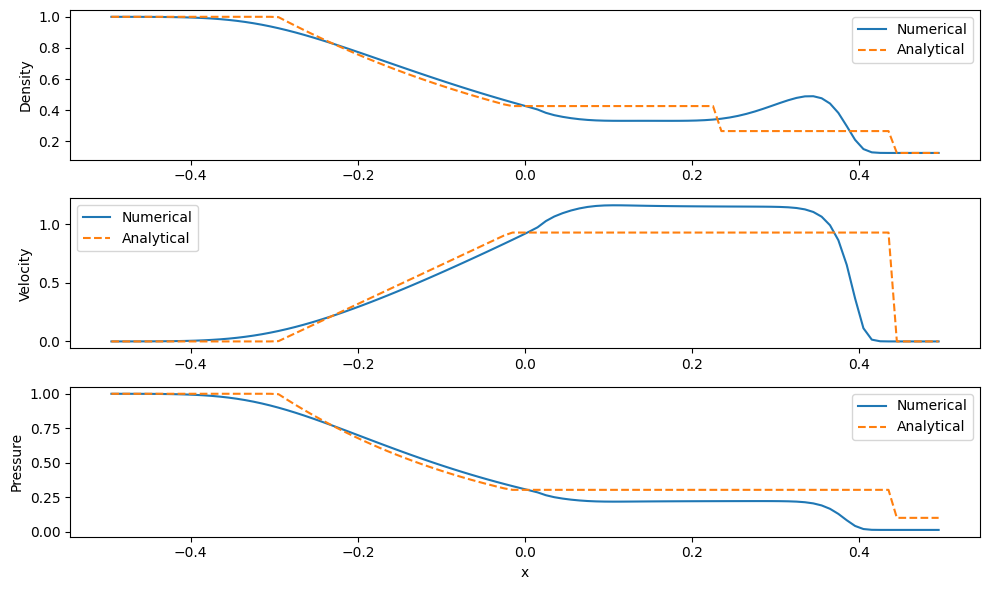

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from hydro_tools import prim_from_q, flux_from_prim, flux_hll, analytic_riemann_problem_solution

# Set parameters for the Sod shock tube problem
gamma = 1.4  # Ratio of specific heats
x_min, x_max = -0.5, 0.5  # Spatial domain
nx = 100  # Number of grid cells
dx = (x_max - x_min) / nx  # Cell size
dt = 0.25 / 400  # Time step size (total time divided by time steps)
time_steps = 400  # Total number of time steps

# Initial conditions for the Sod shock tube
rho_l, u_l, p_l = 1.0, 0.0, 1.0  # Left state
rho_r, u_r, p_r = 0.125, 0.0, 0.1  # Right state

# Initializing the grid
x = np.linspace(x_min + dx/2, x_max - dx/2, nx)  # Cell-centered grid
q = np.zeros((nx, 3))  # Conserved variables: [rho, rho*u, rho*etot]

# Set initial conditions
mid = nx // 2
q[:mid, 0] = rho_l
q[:mid, 1] = rho_l * u_l
q[:mid, 2] = rho_l * (p_l / (gamma - 1) + 0.5 * u_l**2)

q[mid:, 0] = rho_r
q[mid:, 1] = rho_r * u_r
q[mid:, 2] = rho_r * (p_r / (gamma - 1) + 0.5 * u_r**2)

def boundary_conditions(q):
    q[0, 0] = q[1, 0]         
    q[0, 1] = -q[1, 1]        
    q[0, 2] = q[1, 2]         

    q[-1, 0] = q[-2, 0]       
    q[-1, 1] = -q[-2, 1]      
    q[-1, 2] = q[-2, 2]    
    
    return q

# Time evolution loop
for t in range(time_steps):
    flux = flux_hll(q, gamma=gamma, dx=dx, dt=dt)
    q -= dt / dx * (flux[1:] - flux[:-1])
    q = boundary_conditions(q)


# Extract primitive variables for plotting
rho, u, eth, etot, p, _ = prim_from_q(q, gamma)

# Analytical solution at t = 0.25
exact_rho, exact_p, exact_u, _, _ = analytic_riemann_problem_solution(
    x, t=0.25, gamma=gamma, rho_l=rho_l, u_l=u_l, p_l=p_l, rho_r=rho_r, u_r=u_r, p_r=p_r
)


plt.figure(figsize=(10, 6))

plt.subplot(3, 1, 1)
plt.plot(x, rho, label='Numerical')
plt.plot(x, exact_rho, label='Analytical', linestyle='--')
plt.ylabel('Density')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(x, u, label='Numerical')
plt.plot(x, exact_u, label='Analytical', linestyle='--')
plt.ylabel('Velocity')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(x, p, label='Numerical')
plt.plot(x, exact_p, label='Analytical', linestyle='--')
plt.ylabel('Pressure')
plt.xlabel('x')
plt.legend()

plt.tight_layout()
plt.show()


We can see that the analytical solution coincides with the one in the instructions, but as stated there, the numerical curves are smeared out and do not coinicide fully with the analytical solution.

## 3. and 4.

In [9]:
from slope_tools import superbeeslope

def flux_hll(q,gamma=1.4,dx=None,dt=None,slope=None):

    
    # Left and right cells
    q_L       = q[:-1].copy()
    q_R       = q[1:].copy()

    if slope is not None:
        print('Slope limiter not yet implemented. Exercise: Implement it here using the MUSCL-Hancock algorithm.')

    # Update everything before calling the Riemann solver
    rho_L,u_L,eth_L,etot_L,p_L,csadi_L = prim_from_q(q_L,gamma=gamma)
    rho_R,u_R,eth_R,etot_R,p_R,csadi_R = prim_from_q(q_R,gamma=gamma)
    f_L       = flux_from_prim(rho_L,u_L,etot_L,p_L)
    f_R       = flux_from_prim(rho_R,u_R,etot_R,p_R)
    
    # HLL Algorithm
    s_L       = np.minimum( u_L - csadi_L , u_R - csadi_R )  # lambda_minus
    s_R       = np.maximum( u_L + csadi_L , u_R + csadi_R )  # lambda_plus
    flux      = np.zeros((q.shape[0]+1,q.shape[1]))
    flvw      = flux[1:-1,:]  # Ignore the left and rightmost fluxes for now
    ii        = (s_L>=0)                           # Left state mask
    flvw[ii]  = f_L[ii]
    ii        = np.logical_and( s_R>0 , s_L<0 )    # Middle state mask
    flvw[ii]  = ( s_R[ii,None]*f_L[ii] - s_L[ii,None]*f_R[ii] + s_R[ii,None] * s_L[ii,None] *
                  ( q_R[ii] - q_L[ii] ) ) / ( s_R[ii,None] - s_L[ii,None] )
    ii        = (s_R<=0)                           # Right state mask
    flvw[ii]  = f_R[ii]
    return flux

# Initialize the grid
q = np.zeros((nx, 3))

# Set initial conditions
mid = nx // 2
q[:mid, 0] = rho_l
q[:mid, 1] = rho_l * u_l
q[:mid, 2] = rho_l * (p_l / (gamma - 1) + 0.5 * u_l**2)
q[mid:, 0] = rho_r
q[mid:, 1] = rho_r * u_r
q[mid:, 2] = rho_r * (p_r / (gamma - 1) + 0.5 * u_r**2)


for t in range(time_steps):
    # Compute slopes for each conserved variable
    slopes = np.zeros_like(q)
    for i in range(3):  # Loop over the three conserved variables (rho, rho*u, rho*etot)
        slopes[1:-1, i] = superbeeslope(q[:, i], dx)

    # Reconstruct states at interfaces using MUSCL-Hancock
    qL = np.zeros_like(q)
    qR = np.zeros_like(q)
    qL[1:] = q[:-1] + 0.5 * slopes[:-1] * dx
    qR[:-1] = q[1:] - 0.5 * slopes[1:] * dx

    # Apply flux correction for half-step evolution
    rho, u, eth, etot, p, _ = prim_from_q(q, gamma) 
    flux = flux_from_prim(rho, u, etot, p)
    qL[1:] -= 0.5 * dt / dx * (flux[1:] - flux[:-1])
    qR[:-1] -= 0.5 * dt / dx * (flux[1:] - flux[:-1])

    
    # Compute fluxes at interfaces using HLL solver
    flux = flux_hll(q_reconstructed, gamma=gamma, dx=dx, dt=dt)

    # Update conserved variables
    q -= dt / dx * (flux[1:] - flux[:-1])

    # Apply boundary conditions
    q = boundary_conditions(q)
    

# Extract primitive variables for plotting
rho, u, eth, etot, p, _ = prim_from_q(q, gamma)




plt.figure(figsize=(10, 6))
plt.subplot(3, 1, 1)
plt.plot(x, rho, label='Numerical')
plt.plot(x, exact_rho, label='Analytical', linestyle='--')
plt.ylabel('Density')
plt.legend()
plt.subplot(3, 1, 2)
plt.plot(x, u, label='Numerical')
plt.plot(x, exact_u, label='Analytical', linestyle='--')
plt.ylabel('Velocity')
plt.legend()
plt.subplot(3, 1, 3)
plt.plot(x, p, label='Numerical')
plt.plot(x, exact_p, label='Analytical', linestyle='--')
plt.ylabel('Pressure')
plt.xlabel('x')
plt.legend()
plt.tight_layout()
plt.show()


NameError: name 'q_reconstructed' is not defined

In [10]:
from slope_tools import superbeeslope

def prim_from_q(q,gamma=1.4):
    """
    Compute and return the primitive variables from state vector array q.
    The first index of q[:,:] is the spatial (1D) index, while the second
    index is 0, 1 or 2, meaning rho, rho*u, rho*etot. 
    """
    rho       = q[:,0]
    assert rho.min()>=0, 'Error: Negative density detected'
    u         = q[:,1]/rho
    etot      = q[:,2]/rho
    ekin      = 0.5*u**2
    eth       = etot-ekin
    assert eth.min()>=0, 'Error: Negative thermal energy detected'
    p         = (gamma-1) * rho * eth
    csadi     = np.sqrt( gamma * p / rho )
    return rho,u,eth,etot,p,csadi
    
def flux_hll(q,gamma=1.4,dx=None,dt=None,slope=None):

    # Compute slopes for each conserved variable
    slopes = np.zeros_like(q)
    for i in range(3):  # Loop over the three conserved variables (rho, rho*u, rho*etot)
        slopes[1:-1, i] = superbeeslope(q[:, i], dx)

    # Reconstruct states at interfaces using MUSCL-Hancock
    qL = np.zeros_like(q)
    qR = np.zeros_like(q)
    qL[1:] = q[:-1] + 0.5 * slopes[:-1] * dx
    qR[:-1] = q[1:] - 0.5 * slopes[1:] * dx

    # Apply flux correction for half-step evolution
    rho_L, u_L, eth_L, etot_L, p_L, _ = prim_from_q(qL, gamma) 
    flux_L = flux_from_prim(rho_L, u_L, etot_L, p_L)
    rho_R, u_R, eth_R, etot_R, p_R, _ = prim_from_q(qR, gamma) 
    flux_R = flux_from_prim(rho_R, u_R, etot_R, p_R)
    qL[1:] -= 0.5 * dt / dx * (flux_R[:-1] - flux_L[1:])
    qR[:-1] -= 0.5 * dt / dx * (flux_R[1:] - flux_L[:-1])
    
    q_L = qL
    q_R = qR

    if slope is not None:
        print('Slope limiter not yet implemented. Exercise: Implement it here using the MUSCL-Hancock algorithm.')

    # Update everything before calling the Riemann solver
    rho_L,u_L,eth_L,etot_L,p_L,csadi_L = prim_from_q(q_L,gamma=gamma)
    rho_R,u_R,eth_R,etot_R,p_R,csadi_R = prim_from_q(q_R,gamma=gamma)
    f_L       = flux_from_prim(rho_L,u_L,etot_L,p_L)
    f_R       = flux_from_prim(rho_R,u_R,etot_R,p_R)
    
    # HLL Algorithm
    s_L       = np.minimum( u_L - csadi_L , u_R - csadi_R )  # lambda_minus
    s_R       = np.maximum( u_L + csadi_L , u_R + csadi_R )  # lambda_plus
    flux      = np.zeros((q.shape[0]+1,q.shape[1]))
    flvw      = flux[1:-1,:]  # Ignore the left and rightmost fluxes for now
    ii        = (s_L>=0)                           # Left state mask
    flvw[ii]  = f_L[ii]
    ii        = np.logical_and( s_R>0 , s_L<0 )    # Middle state mask
    flvw[ii]  = ( s_R[ii,None]*f_L[ii] - s_L[ii,None]*f_R[ii] + s_R[ii,None] * s_L[ii,None] *
                  ( q_R[ii] - q_L[ii] ) ) / ( s_R[ii,None] - s_L[ii,None] )
    ii        = (s_R<=0)                           # Right state mask
    flvw[ii]  = f_R[ii]
    return flux

# Initialize the grid
q = np.zeros((nx, 3))

# Set initial conditions
mid = nx // 2
q[:mid, 0] = rho_l
q[:mid, 1] = rho_l * u_l
q[:mid, 2] = rho_l * (p_l / (gamma - 1) + 0.5 * u_l**2)
q[mid:, 0] = rho_r
q[mid:, 1] = rho_r * u_r
q[mid:, 2] = rho_r * (p_r / (gamma - 1) + 0.5 * u_r**2)


for t in range(time_steps):
    flux = flux_hll(q, gamma=gamma, dx=dx, dt=dt)
    q -= dt / dx * (flux[1:] - flux[:-1])
    q = boundary_conditions(q)
        

# Extract primitive variables for plotting
rho, u, eth, etot, p, _ = prim_from_q(q, gamma)




plt.figure(figsize=(10, 6))
plt.subplot(3, 1, 1)
plt.plot(x, rho, label='Numerical')
plt.plot(x, exact_rho, label='Analytical', linestyle='--')
plt.ylabel('Density')
plt.legend()
plt.subplot(3, 1, 2)
plt.plot(x, u, label='Numerical')
plt.plot(x, exact_u, label='Analytical', linestyle='--')
plt.ylabel('Velocity')
plt.legend()
plt.subplot(3, 1, 3)
plt.plot(x, p, label='Numerical')
plt.plot(x, exact_p, label='Analytical', linestyle='--')
plt.ylabel('Pressure')
plt.xlabel('x')
plt.legend()
plt.tight_layout()
plt.show()


C:\Users\roger\AppData\Local\Temp\ipykernel_16628\1185268081.py:11: RuntimeWarning: invalid value encountered in divide
  u         = q[:,1]/rho
C:\Users\roger\AppData\Local\Temp\ipykernel_16628\1185268081.py:12: RuntimeWarning: invalid value encountered in divide
  etot      = q[:,2]/rho


AssertionError: Error: Negative thermal energy detected

In [15]:
def flux_hll_reconstructed(qL, qR, gamma=1.4):
    """
    Compute the HLL flux given left and right states at each interface.
    qL and qR are arrays of shape [nx+1, 3].
    """
    rho_L, u_L, eth_L, etot_L, p_L, csadi_L = prim_from_q(qL, gamma=gamma)
    rho_R, u_R, eth_R, etot_R, p_R, csadi_R = prim_from_q(qR, gamma=gamma)

    f_L = flux_from_prim(rho_L, u_L, etot_L, p_L)
    f_R = flux_from_prim(rho_R, u_R, etot_R, p_R)

    s_L = np.minimum(u_L - csadi_L, u_R - csadi_R)  # Left wave speed
    s_R = np.maximum(u_L + csadi_L, u_R + csadi_R)  # Right wave speed

    flux = np.zeros_like(f_L)
    mask_L = s_L >= 0  # Regions dominated by the left state
    mask_R = s_R <= 0  # Regions dominated by the right state
    mask_M = ~mask_L & ~mask_R  # Regions with intermediate states

    # Left state flux
    flux[mask_L] = f_L[mask_L]

    # Right state flux
    flux[mask_R] = f_R[mask_R]

    # HLL flux for the intermediate state
    flux[mask_M] = (
        s_R[mask_M, None] * f_L[mask_M]
        - s_L[mask_M, None] * f_R[mask_M]
        + s_R[mask_M, None] * s_L[mask_M, None] * (qR[mask_M] - qL[mask_M])
    ) / (s_R[mask_M, None] - s_L[mask_M, None])

    return flux


from slope_tools import superbeeslope


# Initialize the grid
q = np.zeros((nx, 3))

# Set initial conditions
mid = nx // 2
q[:mid, 0] = rho_l
q[:mid, 1] = rho_l * u_l
q[:mid, 2] = rho_l * (p_l / (gamma - 1) + 0.5 * u_l**2)
q[mid:, 0] = rho_r
q[mid:, 1] = rho_r * u_r
q[mid:, 2] = rho_r * (p_r / (gamma - 1) + 0.5 * u_r**2)


for t in range(time_steps):
    # Compute slopes for each conserved variable
    slopes = np.zeros_like(q)
    for i in range(3):  # Loop over the three conserved variables (rho, rho*u, rho*etot)
        slopes[1:-1, i] = superbeeslope(q[:, i], dx)

    # Reconstruct states at interfaces using MUSCL-Hancock
    qL = np.zeros_like(q)
    qR = np.zeros_like(q)
    qL[1:] = q[:-1] + 0.5 * slopes[:-1] * dx
    qR[:-1] = q[1:] - 0.5 * slopes[1:] * dx

    # Apply flux correction for half-step evolution
    rho, u, eth, etot, p, _ = prim_from_q(q, gamma) 
    flux = flux_from_prim(rho, u, etot, p)
    qL[1:] -= 0.5 * dt / dx * (flux[1:] - flux[:-1])
    qR[:-1] -= 0.5 * dt / dx * (flux[1:] - flux[:-1])

    
    # Compute fluxes at interfaces using HLL solver
    flux = flux_hll_reconstructed(qL, qR, gamma=gamma)

    # Update conserved variables
    q -= dt / dx * (flux[1:] - flux[:-1])

    # Apply boundary conditions
    q = boundary_conditions(q)
    

# Extract primitive variables for plotting
rho, u, eth, etot, p, _ = prim_from_q(q, gamma)




plt.figure(figsize=(10, 6))
plt.subplot(3, 1, 1)
plt.plot(x, rho, label='Numerical')
plt.plot(x, exact_rho, label='Analytical', linestyle='--')
plt.ylabel('Density')
plt.legend()
plt.subplot(3, 1, 2)
plt.plot(x, u, label='Numerical')
plt.plot(x, exact_u, label='Analytical', linestyle='--')
plt.ylabel('Velocity')
plt.legend()
plt.subplot(3, 1, 3)
plt.plot(x, p, label='Numerical')
plt.plot(x, exact_p, label='Analytical', linestyle='--')
plt.ylabel('Pressure')
plt.xlabel('x')
plt.legend()
plt.tight_layout()
plt.show()


c:\Users\roger\Documents\CodisHD\FSM\sheet11\hydro_tools.py:12: RuntimeWarning: invalid value encountered in divide
  u         = q[:,1]/rho
c:\Users\roger\Documents\CodisHD\FSM\sheet11\hydro_tools.py:13: RuntimeWarning: invalid value encountered in divide
  etot      = q[:,2]/rho


AssertionError: Error: Negative thermal energy detected